<a href="https://colab.research.google.com/github/kshitijmamgain/NLP/blob/master/Natural_Language_Processing_Text_Analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Text Sentiment Analysis
We have labled data set of 10000 reviews on books, songs, movies
 and other stuff. In NLP we have to deal with text which is an unstructured data. There are great tools to effectively extract the information from such unstructured texts.
<br>In this notebook we would do the following:
- Explore the data
- Data Processing
- Creating a base model with __logistic regression__
- Comparing this with __SVM classifier__
- Creating a model with __Gradient Boosting Trees__
- Creating a __Sequnce Model__

#Exploratory Data Analysis

STEP -1: Importing Packages <br>
Below are the list of packageswhich would be used for text processing. I generally put them together in final program to make codes look neat.

In [14]:
import nltk 
nltk.download('punkt')
nltk.download('wordnet')
nltk.download('stopwords')
nltk.download('averaged_perceptron_tagger')

import pandas as pd
import numpy as np
from nltk.tokenize import word_tokenize
from nltk import pos_tag
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from sklearn.preprocessing import LabelEncoder
from collections import defaultdict
from nltk.corpus import wordnet as wn
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn import model_selection, naive_bayes, svm
from sklearn.metrics import accuracy_score
import matplotlib.pyplot as plt
import seaborn as sns


[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Unzipping corpora/wordnet.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Unzipping taggers/averaged_perceptron_tagger.zip.


In [0]:
np.random.seed(500)

STEP -2: Setting Google Colab <br>
Google Colab ofers us tremendous computing speed on its spare CPUs. You can save the data on your google drive and access it in colab. Below codes would provide us access to dataset after we authorize Google.

In [0]:
from google.colab import drive
drive.mount('/content/drive')
Corpus = pd.read_csv(r"/content/drive/My Drive/Colab Notebooks/corpus.csv",encoding='latin-1')

In [0]:
print(Corpus.shape)
Corpus.head(5)

(10000, 2)


,text,label
0,Stuning even for the non-gamer: This sound tr...,__label__2
1,The best soundtrack ever to anything.: I'm re...,__label__2
2,Amazing!: This soundtrack is my favorite musi...,__label__2
3,Excellent Soundtrack: I truly like this sound...,__label__2
4,"Remember, Pull Your Jaw Off The Floor After H...",__label__2


#### Step -3: Data Exploration
After successfully loading the data we would invest some time to explore the dataset

In [0]:
Corpus.describe()

,text,label
count,10000,10000
unique,10000,2
top,Better than the last one and the last one was...,__label__1
freq,1,5097


Text(0, 0.5, 'Number of reviews')

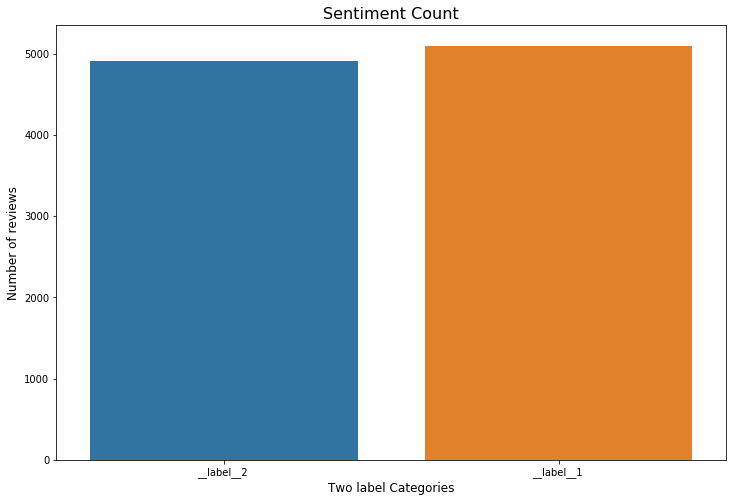

In [0]:
plt.figure(figsize = (12,8))
sns.countplot(Corpus['label'])
plt.title("Sentiment Count", size = 16)
plt.xlabel(xlabel='Two label Categories', size = 12)
plt.ylabel(ylabel='Number of reviews', size = 12)

Text(0.5, 0, 'Word count in each review')

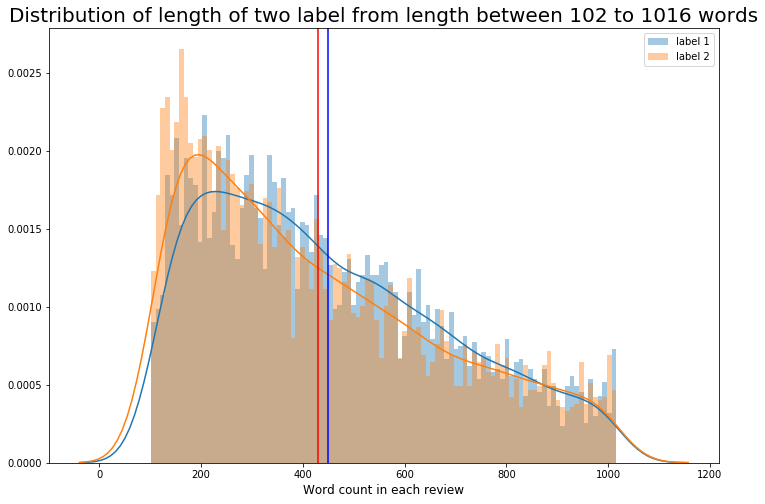

In [0]:
plt.figure(figsize = (12,8))
sns.distplot(Corpus[Corpus['label']=='__label__1 ']['text'].apply(lambda x: len(x)), bins = 100, label = "label 1")
sns.distplot(Corpus[Corpus['label']=='__label__2 ']['text'].apply(lambda x: len(x)), bins = 100, label = "label 2")
plt.title("Distribution of length of two label from length between {} to {} words".format(min(Corpus['text'].apply(lambda x: len(x))),
                                                                            max(Corpus['text'].apply(lambda x: len(x)))), size = 20)
plt.legend()
plt.axvline(x = np.mean(Corpus[Corpus['label']=='__label__1 ']['text'].apply(lambda x: len(x))), color = 'blue')
plt.axvline(x = np.mean(Corpus[Corpus['label']=='__label__2 ']['text'].apply(lambda x: len(x))), color = 'red')

plt.xlabel(xlabel='Word count in each review', size = 12)


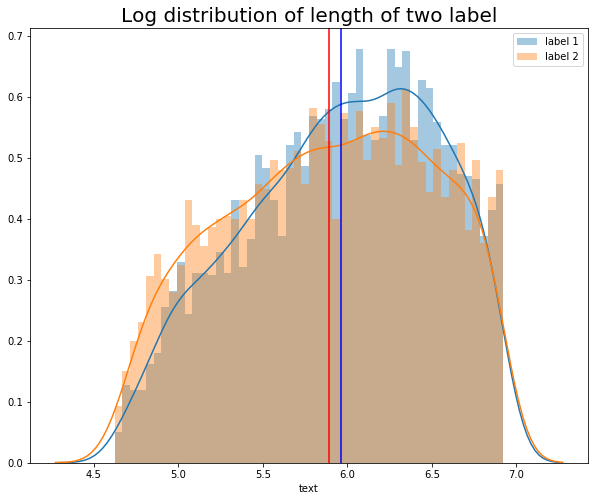

In [0]:
import numpy as np 

plt.figure(figsize = (10,8))
sns.distplot(Corpus[Corpus['label']=='__label__1 ']['text'].apply(lambda x: np.log(len(x))), bins = 50, label = "label 1")
sns.distplot(Corpus[Corpus['label']=='__label__2 ']['text'].apply(lambda x: np.log(len(x))), bins = 50, label = "label 2")
plt.title("Log distribution of length of two label", size = 20)
plt.legend()
plt.axvline(x = np.mean(Corpus[Corpus['label']=='__label__1 ']['text'].apply(lambda x: np.log(len(x)))), color = 'blue')
plt.axvline(x = np.mean(Corpus[Corpus['label']=='__label__2 ']['text'].apply(lambda x: np.log(len(x)))), color = 'red')

We observe that the 10000 reviews are all unique but wre identified positive and negative by label 1 and label 2. We also see that the dataset is balanced and has almost equal number of reviews in positive and negative. <br>We also look at the distribution of length from two types of lable categories. Let us now proceed to text pre-processing.

#Data Processing

##### STEP -4: Data pre-processing
This is an important step in any data mining process. 
This basically involves transforming raw data into an understandable format for NLP models. Real-world data is often incomplete, inconsistent, and/or lacking in certain behaviors or trends, and is likely to contain many errors. Data pre-processing is a proven method of resolving such issues.This will help in getting better results through the classification algorithms.

Below, I have explained the two techniques that are also performed besides other easy to understand steps in data pre-processing:

######  Tokenization: 


This is a process of breaking a stream of text up into words, phrases, symbols, or other meaningful elements called tokens. The list of tokens becomes input for further processing. NLTK Library has word_tokenize and sent_tokenize to easily break a stream of text into a list of words or sentences, respectively.


###### Word Stemming/Lemmatization: 


The aim of both processes is the same, reducing the inflectional forms of each word into a common base or root. Lemmatization is closely related to stemming. The difference is that a stemmer operates on a single word without knowledge of the context, and therefore cannot discriminate between words which have different meanings depending on part of speech. However, stemmers are typically easier to implement and run faster, and the reduced accuracy may not matter for some applications.


Here’s the complete script which performs the aforementioned data pre-processing steps, you can always add or remove steps which best suits the data set you are dealing with:

* Remove Blank rows in Data, if any
* Change all the text to lower case
* Word Tokenization
* Remove Stop words
* Remove Non-alpha text
* Word Lemmatization


In [0]:
# Step - a : Remove blank rows if any.
Corpus.dropna(axis = 0, how = 'any', inplace = True)

# Step - b : Change all the text to lower case. This is required as python interprets 'dog' and 'DOG' differently
Corpus['text'] = [str.lower(txt) for txt in Corpus['text']]

# Step - c : Tokenization : In this each entry in the corpus will be broken into set of words
Corpus['text'] = [word_tokenize(txt) for txt in Corpus['text']]

Corpus.head(3)

,text,label
0,"[stuning, even, for, the, non-gamer, :, this, ...",__label__2
1,"[the, best, soundtrack, ever, to, anything, .,...",__label__2
2,"[amazing, !, :, this, soundtrack, is, my, favo...",__label__2


We see that word_tokenize package from nltk has seperated the text into list of words. It also seperated punctuations

In [0]:
# Step - d1 : Remove Stop words, Non-Numeric and perfom Word Stemming/Lemmenting.
"""
1. to remove stop words the words should not be in stopwords.words('english)
2. to allow only non-numeric .isalpha()
def remove_stopwrds(series):
  txt_series = series.copy()
  for i in range(txt_series.shape[0]):
    tst1 = []
    for word in txt_series.iloc[i]:
        if (word not in stopwords.words('english')) & (word.isalpha()):
            tst1.append(word)
        txt_series.iloc[i] = tst1
  return(txt_series)

"""

#defining a new column with out stop words

Corpus['stp_text'] = Corpus['text'].apply(lambda x: [word for word in x if (word not in stopwords.words('english'))& (word.isalpha())])

Corpus.head()

,text,label,stp_text
0,"[stuning, even, for, the, non-gamer, :, this, ...",__label__2,"[stuning, even, sound, track, beautiful, paint..."
1,"[the, best, soundtrack, ever, to, anything, .,...",__label__2,"[best, soundtrack, ever, anything, reading, lo..."
2,"[amazing, !, :, this, soundtrack, is, my, favo...",__label__2,"[amazing, soundtrack, favorite, music, time, h..."
3,"[excellent, soundtrack, :, i, truly, like, thi...",__label__2,"[excellent, soundtrack, truly, like, soundtrac..."
4,"[remember, ,, pull, your, jaw, off, the, floor...",__label__2,"[remember, pull, jaw, floor, hearing, played, ..."


In [0]:
#Step - d2
# WordNetLemmatizer requires Pos tags to understand if the word is noun or verb or adjective etc. By default it is set to Noun
"""
1. pos tag function
2. Define a function for lemmatizing
"""
def get_wordnet_pos(word):
    """Map POS tag to first character lemmatize() accepts"""
    tag = nltk.pos_tag([word])[0][1][0].upper()
    tag_dict = {"J": wn.ADJ,
                "N": wn.NOUN,
                "V": wn.VERB,
                "R": wn.ADV}

    return tag_dict.get(tag, wn.NOUN)

def word_lemmatizer(series):
  """lemmatizes words in series to their root using POS tag"""
  
  count = series.shape[0] # number of inputs
  txt_series = series.copy()
  lemmatizer = WordNetLemmatizer() # initializing lemmatizer
  
  for i in range(count):
    tst = [lemmatizer.lemmatize(w, get_wordnet_pos(w)) for w in txt_series.iloc[i]]
    txt_series.iloc[i] = tst
  
  return(txt_series)

# a new column with lemmatized words
Corpus['lem_txt'] = word_lemmatizer(Corpus['stp_text'])

In [0]:
Corpus.head(10)

,text,label,stp_text,lem_txt
0,"[stuning, even, for, the, non-gamer, :, this, ...",__label__2,"[stuning, even, sound, track, beautiful, paint...","[stun, even, sound, track, beautiful, paint, s..."
1,"[the, best, soundtrack, ever, to, anything, .,...",__label__2,"[best, soundtrack, ever, anything, reading, lo...","[best, soundtrack, ever, anything, reading, lo..."
2,"[amazing, !, :, this, soundtrack, is, my, favo...",__label__2,"[amazing, soundtrack, favorite, music, time, h...","[amaze, soundtrack, favorite, music, time, han..."
3,"[excellent, soundtrack, :, i, truly, like, thi...",__label__2,"[excellent, soundtrack, truly, like, soundtrac...","[excellent, soundtrack, truly, like, soundtrac..."
4,"[remember, ,, pull, your, jaw, off, the, floor...",__label__2,"[remember, pull, jaw, floor, hearing, played, ...","[remember, pull, jaw, floor, hearing, played, ..."
5,"[an, absolute, masterpiece, :, i, am, quite, s...",__label__2,"[absolute, masterpiece, quite, sure, actually,...","[absolute, masterpiece, quite, sure, actually,..."
6,"[buyer, beware, :, this, is, a, self-published...",__label__1,"[buyer, beware, book, want, know, read, paragr...","[buyer, beware, book, want, know, read, paragr..."
7,"[glorious, story, :, i, loved, whisper, of, th...",__label__2,"[glorious, story, loved, whisper, wicked, sain...","[glorious, story, love, whisper, wicked, saint..."
8,"[a, five, star, book, :, i, just, finished, re...",__label__2,"[five, star, book, finished, reading, whisper,...","[five, star, book, finish, reading, whisper, w..."
9,"[whispers, of, the, wicked, saints, :, this, w...",__label__2,"[whispers, wicked, saints, easy, read, book, m...","[whisper, wicked, saint, easy, read, book, mak..."


In [0]:
#The above dataframe gives us the list of final text but for TF-IDF we need the input as string. So we can create a final column with lambda function
Corpus['text_final'] = Corpus['lem_txt'].apply(lambda x: ' '.join(x))
Corpus['text_final']

0       stun even sound track beautiful paint senery m...
1       best soundtrack ever anything reading lot revi...
2       amaze soundtrack favorite music time hand inte...
3       excellent soundtrack truly like soundtrack enj...
4       remember pull jaw floor hearing played game kn...
                              ...                        
9995    revelation life small town america early thoug...
9996    great biography interest journalist biography ...
9997    interest subject poor presentation tell boring...
9998    buy box look use obviously new try contact ema...
9999    beautiful pen fast delivery pen ship promptly ...
Name: text_final, Length: 10000, dtype: object

##### Prepare Test/ Train/ Datasets

In [0]:
Train_X, Test_X, Train_Y, Test_Y = model_selection.train_test_split(Corpus['text_final'],Corpus['label'],test_size=1/5, random_state = 10)

##### STEP -6: Encoding
Label encode the target variable — This is done to transform Categorical data of string type in the data set into numerical values which the model can understand.

In [0]:
Encoder = LabelEncoder()
Train_Y = Encoder.fit_transform(Train_Y)
Test_Y = Encoder.fit_transform(Test_Y)

In [0]:
Tfidf_vect = TfidfVectorizer(max_features=10000)
Tfidf_vect.fit(Corpus['text_final'])
Train_X_Tfidf = Tfidf_vect.transform(Train_X)
Test_X_Tfidf = Tfidf_vect.transform(Test_X)
Train_X.head()

7496    glitch get everybdy talk glitch troll ccountry...
7694    except drum awsome hatebreed connecticut hardc...
9248    noisy combination cedar nylon make bed incredi...
2470    tasteless trash could give half star would big...
4392    great book book unfortunately line number next...
Name: text_final, dtype: object

In [0]:
print(Tfidf_vect.get_feature_names())

['aa', 'aaa', 'abandon', 'abbey', 'abc', 'abduction', 'aber', 'ability', 'able', 'abomination', 'abound', 'abraham', 'abridge', 'abridgement', 'abroad', 'abrupt', 'abruptly', 'absence', 'absent', 'absolute', 'absolutely', 'absolutley', 'absolutly', 'absorb', 'absorbed', 'abstract', 'absurd', 'abundance', 'abundant', 'abuse', 'abuser', 'abusive', 'abysmal', 'ac', 'academic', 'academically', 'academy', 'acapella', 'accelerate', 'accent', 'accept', 'acceptable', 'acceptance', 'accepted', 'access', 'accessible', 'accessory', 'accident', 'accidental', 'accidentally', 'acclaim', 'accolade', 'accompany', 'accomplish', 'accomplishes', 'accomplishment', 'accord', 'account', 'accounting', 'accuracy', 'accurate', 'accurately', 'accuse', 'ace', 'ache', 'achieve', 'achievement', 'achingly', 'acid', 'acknowledge', 'acne', 'acoustic', 'acquaintance', 'acquire', 'acrobat', 'across', 'act', 'actin', 'action', 'active', 'activity', 'actor', 'actress', 'actual', 'actually', 'acutally', 'ad', 'ada', 'adam

# Visualizing NLP with Wordcloud

Wordcloud package offers different ways to create the word cloud, let us explore this analysis package.<br>
__Visualization for negative labels__

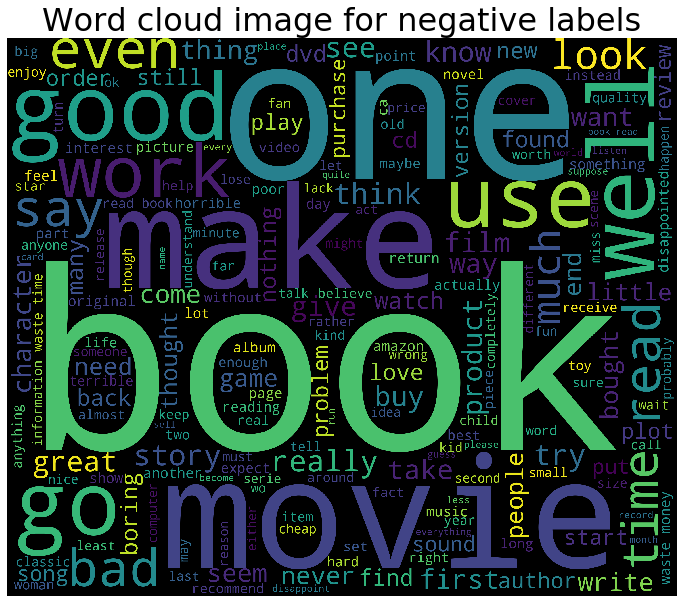

In [0]:
# Way to create image from simple word count
from wordcloud import WordCloud, STOPWORDS
words = ' '.join(Corpus[Corpus['label'] =='__label__1 ']['text_final'])
wordcloud = WordCloud(stopwords=STOPWORDS,
                      background_color='black',
                      width=3000,
                      height=2500
                     ).generate(words)
                     
plt.figure(figsize=(12, 12))
plt.imshow(wordcloud)
plt.title("Word cloud image for negative labels", size = 32)
plt.axis('off')
plt.show()

In [0]:
Tfidf_L = TfidfVectorizer(max_features=1000)
Tfidf_L.fit(Corpus['text_final'])
print(Tfidf_L.vocabulary_)

{'even': 285, 'sound': 824, 'track': 910, 'beautiful': 80, 'paint': 618, 'mind': 555, 'well': 973, 'would': 991, 'people': 628, 'hate': 398, 'video': 950, 'game': 362, 'music': 571, 'played': 648, 'ever': 287, 'best': 88, 'back': 67, 'away': 63, 'take': 868, 'step': 840, 'guitar': 386, 'anyone': 41, 'care': 132, 'listen': 507, 'soundtrack': 825, 'anything': 42, 'reading': 705, 'lot': 518, 'review': 735, 'say': 753, 'figure': 325, 'write': 993, 'bit': 92, 'masterpiece': 535, 'year': 996, 'simply': 794, 'price': 669, 'pretty': 667, 'must': 573, 'go': 375, 'buy': 122, 'cd': 138, 'much': 570, 'money': 564, 'one': 602, 'feel': 319, 'worth': 990, 'every': 288, 'amaze': 32, 'favorite': 317, 'time': 896, 'hand': 390, 'mean': 542, 'hope': 420, 'girl': 371, 'star': 835, 'important': 438, 'throughout': 893, 'high': 410, 'like': 504, 'absolutely': 1, 'probably': 672, 'work': 988, 'heard': 403, 'ca': 124, 'sure': 863, 'never': 582, 'twice': 927, 'wish': 980, 'could': 193, 'give': 372, 'excellent': 

In [0]:
# Using TfiDF frequency
# We could use vocabulary from model to get the term frequency inverse document frequency
from wordcloud import WordCloud, STOPWORDS
words = ' '.join(Corpus[Corpus['label'] =='__label__1 ']['text_final'])
wordcloud = WordCloud(stopwords=STOPWORDS,
                      background_color='black',
                      width=3000,
                      height=2500
                     ).generate_from_frequencies(Tfidf_L.vocabulary_)

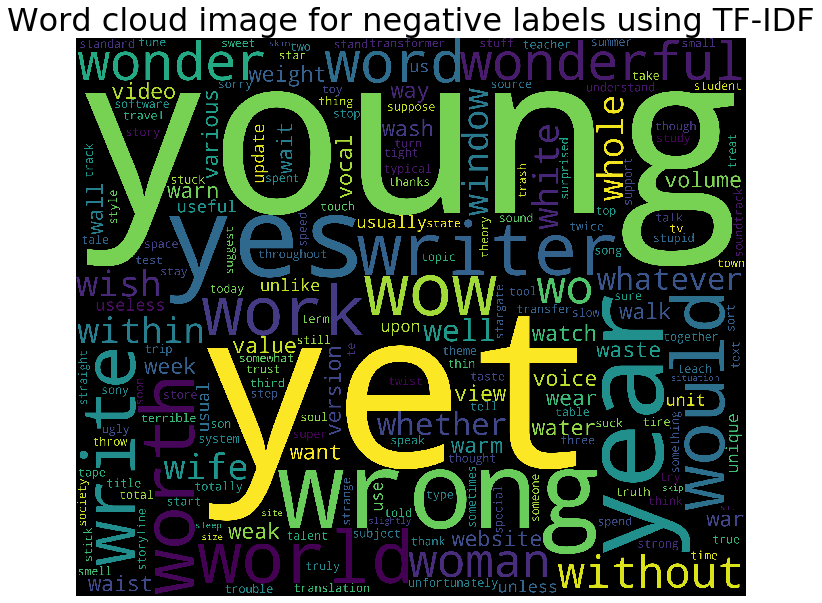

In [0]:
plt.figure(figsize=(12, 12))
plt.imshow(wordcloud)
plt.title("Word cloud image for negative labels using TF-IDF", size = 32)
plt.axis('off')
plt.show()

In [0]:
!pip install multidict

     |████████████████████████████████| 153kB 32.7MB/s 


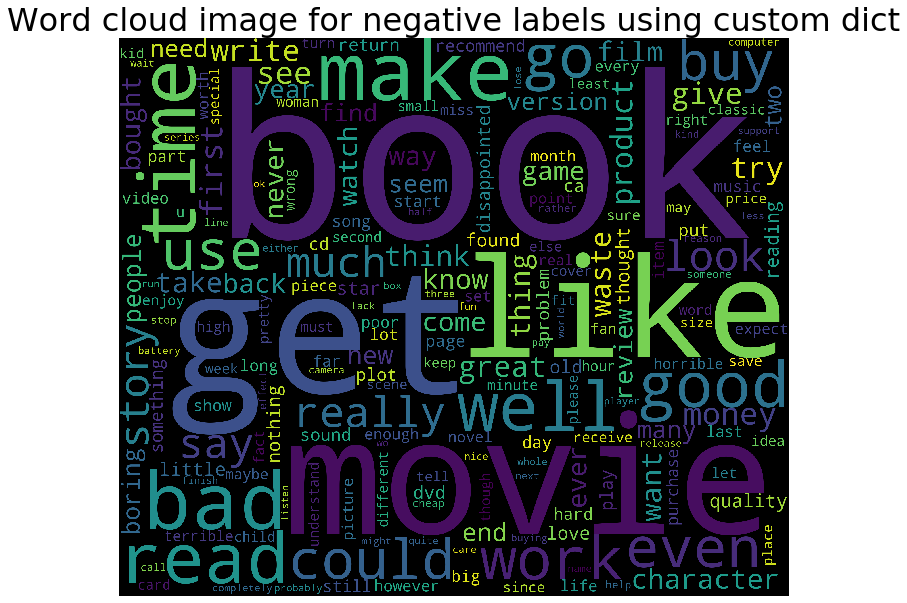

In [0]:
import multidict as multidict
import re
def getFrequencyDictForText(sentence):
    fullTermsDict = multidict.MultiDict()
    tmpDict = {}

    # making dict for counting frequencies
    for text in sentence.split(" "):
        if re.match("a|the|an|the|to|in|for|of|or|by|with|is|on|that|be|yes|young|yet|would", text):
            continue
        val = tmpDict.get(text, 0)
        tmpDict[text.lower()] = val + 1
    for key in tmpDict:
        fullTermsDict.add(key, tmpDict[key])
    return fullTermsDict
getFrequencyDictForText(words)

wordcloud = WordCloud(stopwords=STOPWORDS,
                      background_color='black',
                      width=3000,
                      height=2500
                     ).generate_from_frequencies(getFrequencyDictForText(words))
# Using multidict
plt.figure(figsize=(12, 12))
plt.imshow(wordcloud)
plt.title("Word cloud image for negative labels using custom dict", size = 32)
plt.axis('off')
plt.show()


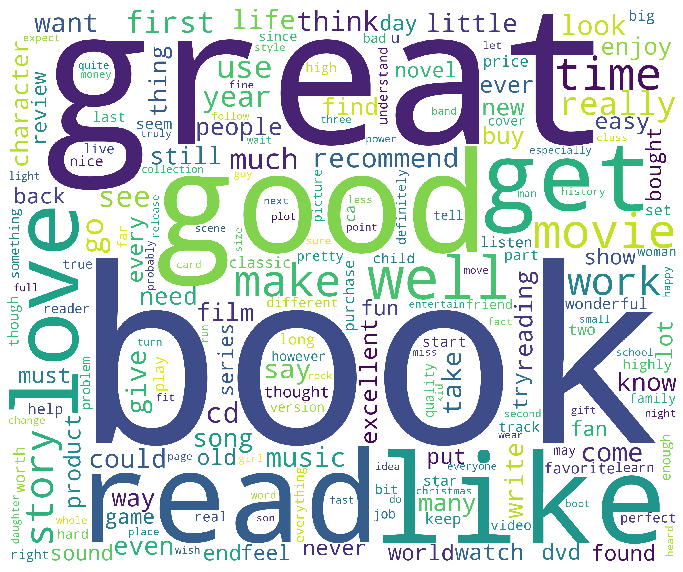

In [0]:
words = ' '.join(Corpus[Corpus['label'] =='__label__2 ']['text_final'])
wordcloud = WordCloud(
                      background_color='white',
                      width=3000,
                      height=2500
                     ).generate_from_frequencies(getFrequencyDictForText(words))
plt.figure(figsize=(12, 12))
plt.imshow(wordcloud)
plt.axis('off')
plt.show()

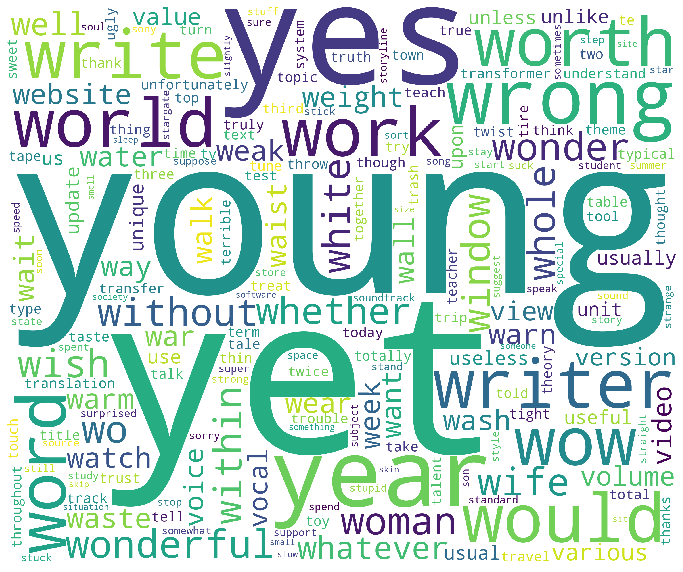

In [0]:
words = ' '.join(Corpus[Corpus['label'] =='__label__2 ']['text_final'])
wordcloud = WordCloud(
                      background_color='white',
                      width=3000,
                      height=2500
                     ).generate_from_frequencies(Tfidf_L.vocabulary_)
plt.figure(figsize=(12, 12))
plt.imshow(wordcloud)
plt.axis('off')
plt.show()

# ML Models
__Logistic Regression__

In [0]:
from sklearn.linear_model import LogisticRegression
LR = LogisticRegression()
LR.fit(Train_X_Tfidf,Train_Y)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [0]:
predictions_LR = LR.predict(Test_X_Tfidf)
print("LR Accuracy Score -> ",accuracy_score(predictions_LR, Test_Y)*100)


LR Accuracy Score ->  84.6


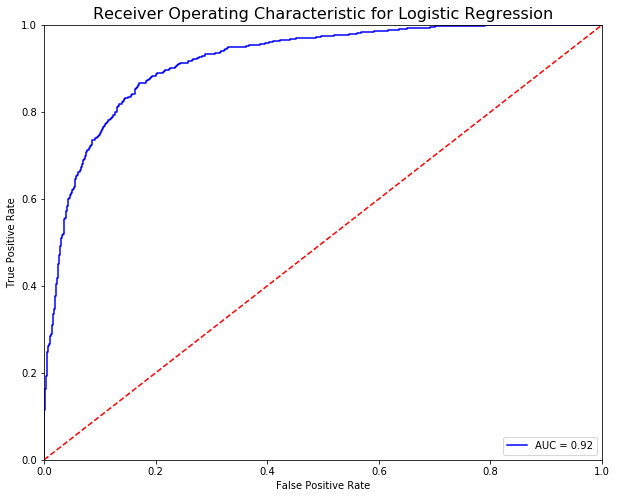

In [0]:
import sklearn.metrics as metrics
# calculate the fpr and tpr for all thresholds of the classification
probs = LR.predict_proba(Test_X_Tfidf)
preds = probs[:,1]
fpr, tpr, threshold = metrics.roc_curve(Test_Y, preds)
roc_auc = metrics.auc(fpr, tpr)

# method I: plt
import matplotlib.pyplot as plt
plt.figure(figsize = (10,8))
plt.title('Receiver Operating Characteristic for Logistic Regression', size = 16)
plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

Logistic: f1=0.848 auc=0.913


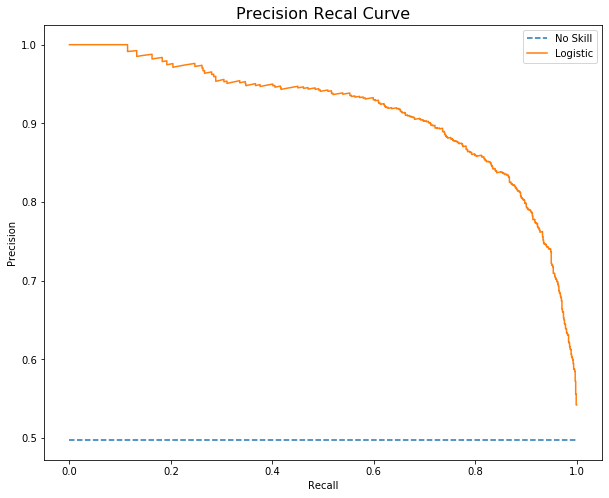

In [0]:
# predict probabilities
lr_probs = LR.predict_proba(Test_X_Tfidf)
# keep probabilities for the positive outcome only
lr_probs = lr_probs[:, 1]
# predict class values
yhat = LR.predict(Test_X_Tfidf)
lr_precision, lr_recall, _ = precision_recall_curve(Test_Y, lr_probs)
lr_f1, lr_auc = metrics.f1_score(Test_Y, yhat), metrics.auc(lr_recall, lr_precision)
# summarize scores
print('Logistic: f1=%.3f auc=%.3f' % (lr_f1, lr_auc))
# plot the precision-recall curves
no_skill = len(Test_Y[Test_Y==1]) / len(Test_Y)
plt.figure(figsize = (10,8))
plt.plot([0, 1], [no_skill, no_skill], linestyle='--', label='No Skill')
plt.plot(lr_recall, lr_precision, label='Logistic')
# axis labels
plt.title('Precision Recal Curve', size = 16)
plt.xlabel('Recall')
plt.ylabel('Precision')
# show the legend
plt.legend()


              precision    recall  f1-score   support

           0       0.86      0.83      0.84      1005
           1       0.83      0.86      0.85       995

    accuracy                           0.85      2000
   macro avg       0.85      0.85      0.85      2000
weighted avg       0.85      0.85      0.85      2000



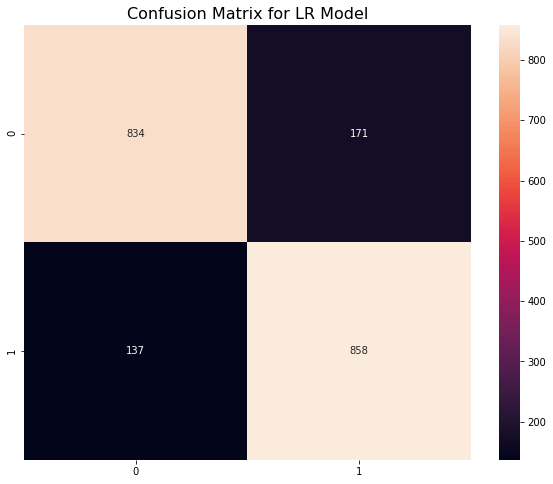

In [0]:
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report
print(classification_report(Test_Y, yhat))

plt.figure(figsize = (10,8))
plt.title("Confusion Matrix for LR Model", size =16)
sns.heatmap(confusion_matrix( Test_Y, yhat), annot = True, fmt='g')


In [0]:
index = 0
misclassifiedIndexes = []
for label, predict in zip(Test_Y, yhat):
 if label != predict: 
  misclassifiedIndexes.append(index)
 index +=1



In [0]:
print(misclassifiedIndexes)

[0, 19, 25, 33, 35, 36, 39, 43, 65, 85, 92, 99, 105, 106, 109, 112, 126, 130, 131, 135, 137, 139, 140, 142, 152, 165, 191, 192, 197, 199, 200, 203, 205, 206, 209, 210, 216, 221, 230, 233, 249, 257, 264, 284, 285, 294, 297, 303, 307, 315, 324, 330, 332, 340, 342, 345, 346, 347, 365, 367, 382, 386, 391, 402, 403, 406, 416, 422, 429, 430, 431, 435, 436, 439, 441, 463, 483, 490, 495, 497, 532, 533, 547, 554, 562, 571, 576, 577, 582, 585, 589, 593, 596, 597, 599, 606, 610, 614, 616, 624, 640, 641, 644, 647, 656, 682, 689, 691, 694, 695, 701, 703, 715, 717, 721, 729, 732, 740, 752, 755, 758, 765, 778, 782, 787, 800, 806, 808, 810, 838, 847, 852, 866, 872, 880, 887, 907, 914, 915, 916, 917, 919, 924, 927, 941, 943, 974, 975, 976, 989, 999, 1003, 1004, 1009, 1017, 1018, 1020, 1028, 1036, 1043, 1051, 1063, 1072, 1074, 1082, 1084, 1085, 1086, 1095, 1097, 1098, 1099, 1116, 1118, 1125, 1126, 1131, 1133, 1150, 1155, 1161, 1174, 1191, 1196, 1211, 1221, 1229, 1236, 1241, 1243, 1244, 1252, 1254, 1256,

In [0]:
Test_X.reset_index()['text_final'].loc[1998], Test_Y[1998]

('good burn never return good pick anyway usual caballero manage hover mile average time tough music less aggressive drum less furious pace overall calmer get wrong limp still spark energy creativity become mature know anything band say find shellac tortoise arty improvisation people call',
 1)

Logistic Regression is the base prediction model which has performed well with the processed data. Now let us see the performance with __Support Vector Machine__

In [0]:
# Classifier - Algorithm - SVM
# fit the training dataset on the classifier
SVM = svm.SVC(C=1.0, kernel='linear', degree=3, gamma='auto')
SVM.fit(Train_X_Tfidf,Train_Y)
# predict the labels on validation dataset
predictions_SVM = SVM.predict(Test_X_Tfidf)


In [0]:
# Use accuracy_score function to get the accuracy
print("SVM Accuracy Score -> ",accuracy_score(predictions_SVM, Test_Y)*100)


SVM Accuracy Score ->  83.7


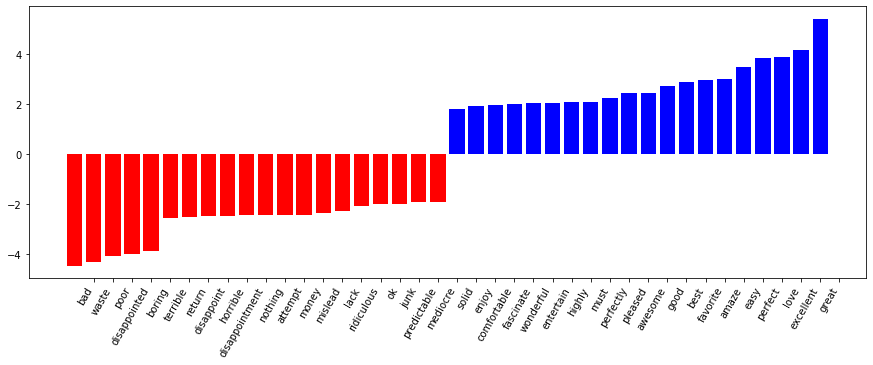

In [0]:
import numpy
def plot_coefficients(classifier, feature_names, top_features=20):
 coef = classifier.coef_.toarray().reshape(-1)
 top_positive_coefficients = np.argsort(coef)[-top_features:]
 top_negative_coefficients = np.argsort(coef)[:top_features]
 top_coefficients = np.hstack([top_negative_coefficients, top_positive_coefficients])
 # create plot
 plt.figure(figsize=(15, 5))
 colors = ['red' if c < 0 else 'blue' for c in coef[top_coefficients]]
 plt.bar(np.arange(2 * top_features), coef[top_coefficients], color=colors)
 feature_names = np.array(feature_names)
 plt.xticks(np.arange(1, 1 + 2 * top_features), feature_names[top_coefficients], rotation=60, ha='right')
 plt.show()

plot_coefficients(SVM, Tfidf_vect.get_feature_names())

__Catboost Classifier__

In [0]:
!pip install catboost

     |████████████████████████████████| 64.0MB 47kB/s 


In [0]:
from catboost import CatBoostClassifier
CB = CatBoostClassifier( 
                           task_type="GPU",
                           devices='0:1',
                        custom_loss=['Accuracy'],
                        iterations= 1000)
CB.fit(Train_X_Tfidf,Train_Y,
        eval_set=(Test_X_Tfidf, Test_Y),
  #     logging_level='Verbose',  # you can uncomment this for text output
        plot=True,
        verbose = False);


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

In [0]:
predictions_CB = CB.predict(Test_X_Tfidf)
# Use accuracy_score function to get the accuracy
print("CB Accuracy Score -> ",accuracy_score(predictions_CB, Test_Y)*100)

CB Accuracy Score ->  81.75


#Results
We observe that SVM has performed a little better than the base model. Let us see the model summary. We would see the:
  - Cross Validation Score
  - Confusion Matrix


In [0]:
from sklearn.model_selection import cross_validate
cv_results = cross_validate(SVM, Train_X_Tfidf,Train_Y, cv=5)


In [0]:
cv_results['test_score'].mean()

0.851125

In [0]:
cv_results_lr = cross_validate(LR, Train_X_Tfidf,Train_Y, cv=5)
cv_results_lr['test_score'].mean()

0.8505

In [0]:
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

print("Results for SVM Classifier")
print("Accuracy Score : ",accuracy_score(predictions_SVM, Test_Y),"\n\n")

print(pd.DataFrame(confusion_matrix( Test_Y, predictions_SVM)))

print(classification_report( Test_Y, predictions_SVM))

Results for SVM Classifier
Accuracy Score :  0.837 


     0    1
0  817  188
1  138  857
              precision    recall  f1-score   support

           0       0.86      0.81      0.83      1005
           1       0.82      0.86      0.84       995

    accuracy                           0.84      2000
   macro avg       0.84      0.84      0.84      2000
weighted avg       0.84      0.84      0.84      2000



In [0]:
print("Results for CatBoost Classifier")
print("Accuracy Score : ",accuracy_score(predictions_CB, Test_Y),"\n\n")

print(pd.DataFrame(confusion_matrix( Test_Y, predictions_CB)))

print(classification_report( Test_Y, predictions_CB))

Results for CatBoost Classifier
Accuracy Score :  0.8325 


     0    1
0  851  185
1  150  814
              precision    recall  f1-score   support

           0       0.85      0.82      0.84      1036
           1       0.81      0.84      0.83       964

    accuracy                           0.83      2000
   macro avg       0.83      0.83      0.83      2000
weighted avg       0.83      0.83      0.83      2000



__Conclusion:__ In this project we compared performance of Logit, SVM and CatBoost Classifier. We see that how effective is Support Vector as a sentiment classifier

# Why is SVM able to classify text so well?
__Observation__: We notice that some words get repeated yet other words find more mention depending on the label. For each such word the svm model creates a feature and as long as SVM is able to derive hyper-plane in the multidimensional word space it works as a great classifier<br>
Choosing the technique of lemmatizing also plays an important part in creating a robust model that does not under-fit

#LSTM Framework

In [0]:
from sklearn.feature_extraction.text import CountVectorizer
from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences
from keras.models import Sequential
from keras.layers import Dense, Embedding, LSTM
from sklearn.model_selection import train_test_split
from keras.utils.np_utils import to_categorical
import re
import pandas as pd
Corpus_df = pd.read_csv(r"/content/drive/My Drive/Colab Notebooks/corpus.csv",encoding='latin-1')
Corpus_df.columns

Using TensorFlow backend.


Index(['text', 'label'], dtype='object')

In [0]:
# Pad Sequence
max_fatures = 10000
tokenizer = Tokenizer(nb_words=max_fatures, split=' ')
tokenizer.fit_on_texts(Corpus_df['text'].values)
X1 = tokenizer.texts_to_sequences(Corpus_df['text'].values)
X1 = pad_sequences(X1)
Y1 = pd.get_dummies(Corpus_df['label']).values
X1_train, X1_test, Y1_train, Y1_test = train_test_split(X1,Y1,test_size = 1/5, random_state = 26)
print(X1_train.shape,Y1_train.shape)
print(X1_test.shape,Y1_test.shape)

/usr/local/lib/python3.6/dist-packages/keras_preprocessing/text.py:178: UserWarning: The `nb_words` argument in `Tokenizer` has been renamed `num_words`.
  warnings.warn('The `nb_words` argument in `Tokenizer` '


(8000, 201) (8000, 2)
(2000, 201) (2000, 2)


In [0]:
embed_dim = 128
lstm_out = 200
model = tf.keras.Sequential()
model.add(tf.keras.layers.Embedding(max_fatures, embed_dim,input_length = X1.shape[1]))
model.add(tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(embed_dim,dropout=0.2,recurrent_dropout=0.2)))
model.add(tf.keras.layers.Dense(2,activation='sigmoid'))
model.compile(loss = 'categorical_crossentropy', optimizer='adam',metrics = ['accuracy'])
print(model.summary())

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding (Embedding)        (None, 201, 128)          1280000   
_________________________________________________________________
bidirectional (Bidirectional (None, 256)               263168    
_________________________________________________________________
dense (Dense)                (None, 2)                 514       
Total params: 1,543,682
Trainable params: 1,543,682
Non-trainable params: 0
_________________________________________________________________
None


In [0]:
import os
import datetime
import tensorflow as tf
logdir = os.path.join("logs", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
tensorboard_callback1 = tf.keras.callbacks.TensorBoard(logdir, histogram_freq=1)
batch_size = 64


history = model.fit(X1_train, Y1_train, epochs = 10, batch_size=batch_size, 
          validation_data=(X1_test, Y1_test), 
            callbacks=[tensorboard_callback1],
          verbose = 2)

Train on 8000 samples, validate on 2000 samples
Epoch 1/10
8000/8000 - 104s - loss: 0.5842 - acc: 0.6824 - val_loss: 0.4028 - val_acc: 0.8220
Epoch 2/10
8000/8000 - 102s - loss: 0.3072 - acc: 0.8780 - val_loss: 0.3465 - val_acc: 0.8620
Epoch 3/10
8000/8000 - 102s - loss: 0.2282 - acc: 0.9140 - val_loss: 0.6031 - val_acc: 0.7960
Epoch 4/10
8000/8000 - 102s - loss: 0.1556 - acc: 0.9427 - val_loss: 0.4191 - val_acc: 0.8480
Epoch 5/10
8000/8000 - 102s - loss: 0.1041 - acc: 0.9663 - val_loss: 0.5038 - val_acc: 0.8415
Epoch 6/10
8000/8000 - 103s - loss: 0.0789 - acc: 0.9754 - val_loss: 0.5316 - val_acc: 0.8390
Epoch 7/10
8000/8000 - 100s - loss: 0.0822 - acc: 0.9701 - val_loss: 0.6355 - val_acc: 0.8120
Epoch 8/10
8000/8000 - 100s - loss: 0.0621 - acc: 0.9806 - val_loss: 0.6360 - val_acc: 0.8110
Epoch 9/10
8000/8000 - 99s - loss: 0.0508 - acc: 0.9831 - val_loss: 0.6827 - val_acc: 0.8360
Epoch 10/10
8000/8000 - 100s - loss: 0.0352 - acc: 0.9893 - val_loss: 0.7598 - val_acc: 0.8310


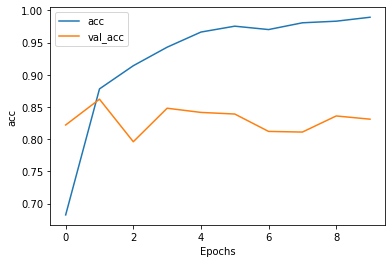

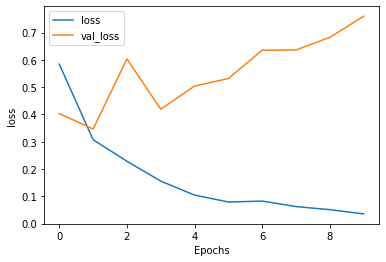

In [0]:
def plot_graphs(history, string):
  plt.plot(history.history[string])
  plt.plot(history.history['val_'+string])
  plt.xlabel("Epochs")
  plt.ylabel(string)
  plt.legend([string, 'val_'+string])
  plt.show()
  
plot_graphs(history, "acc")
plot_graphs(history, "loss")

In [0]:
# Load the TensorBoard notebook extension
%load_ext tensorboard
#tf.keras.backend.clear_session()

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [0]:
tensorboard --logdir logs

Reusing TensorBoard on port 6006 (pid 3544), started 0:34:13 ago. (Use '!kill 3544' to kill it.)

In [1]:
!pip install transformers

from transformers import BertModel, BertTokenizer, BertForSequenceClassification

     |████████████████████████████████| 491kB 35.7MB/s 
     |████████████████████████████████| 1.0MB 51.7MB/s 
     |████████████████████████████████| 3.8MB 60.5MB/s 
     |████████████████████████████████| 870kB 65.4MB/s 
  Created wheel for sacremoses: filename=sacremoses-0.0.38-cp36-none-any.whl size=884628 sha256=75bece56bd8c2ad18dd15a03562294f12a2a51ddc81373ae130fdf7e1bf00631
  Stored in directory: /root/.cache/pip/wheels/6d/ec/1a/21b8912e35e02741306f35f66c785f3afe94de754a0eaf1422
Successfully built sacremoses


In [2]:
bert_model = BertModel.from_pretrained('bert-base-uncased')
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')

#Conclusion
We have implemented diffent machine learning models. In building the squence model we observe that the loss value in the validation error goes up after the second epoch. However accuracy is going up. Clearly there is need to further tune up the parameters.
A further followup with this project would be create an ensemble model after combining the different models

In [0]:
from torch.utils.data import Dataset, DataLoader

class LoadDataset(Dataset):

    def __init__(self, filename, maxlen):

        # Store the contents of the file in a pandas dataframe
        self.df = pd.read_csv(filename, delimiter=',')

        # Initialize the BERT tokenizer
        self.tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')

        # Define the Maxlength for padding/truncating
        self.maxlen = maxlen

    def __len__(self):
        return len(self.df)

    def __getitem__(self, index):

        # Selecting the sentence and label at the specified index in the data frame
        sentence = self.df.loc[index, 'text']
        label = self.df.loc[index, 'label']

        # Tokenize the sentence
        tokens = self.tokenizer.tokenize(sentence)

        # Inserting the CLS and SEP token at the beginning and end of the sentence
        tokens = ['[CLS]'] + tokens + ['[SEP]']
        
        # Padding/truncating the sentences to the maximum length
        if len(tokens) < self.maxlen:
            tokens = tokens + ['[PAD]' for _ in range(self.maxlen - len(tokens))]
        else:
            tokens = tokens[:self.maxlen-1] + ['[SEP]']
        
        # Convert the sequence to ids with BERT Vocabulary
        tokens_ids = self.tokenizer.convert_tokens_to_ids(tokens)
        
        # Converting the list to a pytorch tensor
        tokens_ids_tensor = torch.tensor(tokens_ids)

        # Obtaining the attention mask
        attn_mask = (tokens_ids_tensor != 0).long()

        return tokens_ids_tensor, attn_mask, label

In [0]:
train, test = model_selection.train_test_split(Corpus_df[['text','label']],test_size=1/5)

train['label'] = train.label.map({'__label__1 ':0,'__label__2 ':1})
test['label'] = test.label.map({'__label__1 ':0,'__label__2 ':1})

train.to_csv('train.csv')

test.to_csv('test.csv')

In [0]:

# Creating instances of training and validation set
train_set = LoadDataset( 'train.csv', maxlen = 64)
val_set = LoadDataset('test.csv', maxlen = 64)

In [0]:
# Creating intsances of training and validation dataloaders
train_loader = DataLoader(train_set, batch_size = 16, num_workers = 5)
val_loader = DataLoader(val_set, batch_size = 16, num_workers = 5)

### Building the model

In [0]:
from torch import nn
class SentimentClassifier(nn.Module):

    def __init__(self, freeze_bert = True):
        super(SentimentClassifier, self).__init__()

        # Instantiating the BERT model object 
        self.bert_layer = BertModel.from_pretrained('bert-base-uncased')
        
        # Defining layers like dropout and linear
        self.dropout = nn.Dropout(0.1)
        self.classifier = nn.Linear(768, 1)

    def forward(self, seq, attn_masks):
        '''
        Inputs:
            -seq : Tensor of shape [B, T] containing token ids of sequences
            -attn_masks : Tensor of shape [B, T] containing attention masks to be used to avoid contibution of PAD tokens
        '''

        # Getting contextualized representations from BERT Layer
        cont_reps, _ = self.bert_layer(seq, attention_mask = attn_masks)

        # Obtaining the representation of [CLS] head
        cls_rep = cont_reps[:, 0]
        # print('CLS shape: ',cls_rep.shape)

        # Feeding cls_rep to the classifier layer
        logits = self.classifier(cls_rep)
        # print('Logits shape: ',logits.shape)

        return logits

In [0]:
model = SentimentClassifier()

In [0]:
import torch
from torch.optim import Adam
from torch.nn import BCEWithLogitsLoss

criterion = BCEWithLogitsLoss()
optimizer = Adam(model.parameters(), lr = 2e-5)

In [0]:
if torch.cuda.is_available():
  device = 'cuda'
else:
  device = 'cpu'

print(device)

cuda


In [0]:
# Defining a function for calculating accuracy
def logits_accuracy(logits, labels):
    probs = torch.sigmoid(logits.unsqueeze(-1))
    preds = (probs > 0.5).long()
    acc = (preds.squeeze() == labels).float().mean()
    return acc

In [0]:
# Defining an evaluation function for training 
def evaluate(net, criterion, val_loader, device):
  
    losses, accuracies = 0, 0
    
    # Setting model to evaluation mode
    net.eval()

    count = 0
    for (seq, attn_masks, labels) in val_loader:
        count += 1

        # Move inputs and targets to device
        seq, attn_masks, labels = seq.to(device), attn_masks.to(device), labels.to(device)

        # Get logit predictions
        val_logits = net(seq, attn_masks)

        # Calculate loss
        val_loss = criterion(val_logits.squeeze(-1), labels.float())
        losses += val_loss.item()

        # Calculate validation accuracy
        accuracies += logits_accuracy(val_logits, labels)

    return losses / count, accuracies / count

In [0]:
from time import time
def train(net, criterion, optimizer, train_loader, val_loader, device, epochs=4, print_every=100):
    
    # Move model to device
    net.to(device)
    # Setting model to training mode
    net.train()

    print('========== ========== STARTING TRAINING ========== ==========')

    for epoch in range(epochs):

        print('\n\n========== EPOCH {} =========='.format(epoch))        
        t1 = time()

        for i, (seq, attn_masks, labels) in enumerate(train_loader):

            # Clear gradients
            optimizer.zero_grad()  

            # Moving tensors to device
            seq, attn_masks, labels = seq.to(device), attn_masks.to(device), labels.to(device)

            # Obtaining the logits from the model
            logits = net(seq,attn_masks)

            # Calculating the loss
            loss = criterion(logits.squeeze(-1), labels.float())

            # Backpropagating the gradients
            loss.backward()

            # Clipping gradients to tackle exploding gradients
            nn.utils.clip_grad_norm_(net.parameters(), 1)

            # Optimization step
            optimizer.step()

            if (i + 1) % print_every == 0:
                print("Iteration {} ==== Loss: {}".format(i+1, loss.item()))

        t2 = time()
        print('Time Taken for Epoch: {}'.format(t2-t1))
        print('\n========== Validating ==========')
        mean_val_loss, mean_val_acc = evaluate(net, criterion, val_loader, device)
        print("Validation Loss: {}\nValidation Accuracy: {}".format(mean_val_loss, mean_val_acc))


In [0]:
%%time
# starting training
train(model, criterion, optimizer, train_loader, val_loader, device, epochs=4, print_every=100)

========== ========== STARTING TRAINING ========== ==========


========== EPOCH 0 ==========
Iteration 100 ==== Loss: 0.45333999395370483
Iteration 200 ==== Loss: 0.18726599216461182
Iteration 300 ==== Loss: 0.2039826512336731
Iteration 400 ==== Loss: 0.240125834941864
Iteration 500 ==== Loss: 0.4898584187030792
Time Taken for Epoch: 153.39166569709778

========== Validating ==========
Validation Loss: 0.386472350416705
Validation Accuracy: 0.9125000238418579


========== EPOCH 1 ==========
Iteration 100 ==== Loss: 0.2610454857349396
Iteration 200 ==== Loss: 0.003129493212327361
Iteration 300 ==== Loss: 0.0640702173113823
Iteration 400 ==== Loss: 0.26566746830940247
Iteration 500 ==== Loss: 0.007370905019342899
Time Taken for Epoch: 150.11786270141602

========== Validating ==========
Validation Loss: 0.4488500752933323
Validation Accuracy: 0.9180000424385071


========== EPOCH 2 ==========
Iteration 100 ==== Loss: 0.22174373269081116
Iteration 200 ==== Loss: 0.0006761456606909633
Ite

In [0]:
# Saving our model
import os
save_path = '/content/drive/My Drive/Colab Notebooks/bert'
if not os.path.isdir(save_path):
    os.mkdir(save_path)

torch.save({
    'model_state_dict': model.state_dict(),
    'optimizer_state_dict': optimizer.state_dict()
}, '/content/drive/My Drive/Colab Notebooks/bert/model.pth')

In [16]:
# Loading the checkpoints for resuming training
checkpoint = torch.load('/content/drive/My Drive/Colab Notebooks/bert/model.pth')
model.load_state_dict(checkpoint['model_state_dict'])

<All keys matched successfully>

In [17]:
import torch
#predictions
# predictor
inference_file = torch.load('/content/drive/My Drive/Colab Notebooks/bert/model.pth')
predictor = SentimentClassifier()
predictor.load_state_dict(inference_file['model_state_dict'])

<All keys matched successfully>

In [0]:
def preprocess(sentence, maxlen=64):

    tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')

    # Tokenize the sentence
    tokens = tokenizer.tokenize(sentence)

    # Inserting the CLS and SEP token at the beginning and end of the sentence
    tokens = ['[CLS]'] + tokens + ['[SEP]']
    
    # Padding/truncating the sentences to the maximum length
    if len(tokens) < maxlen:
        tokens = tokens + ['[PAD]' for _ in range(maxlen - len(tokens))]
    else:
        tokens = tokens[:maxlen-1] + ['[SEP]']
    
    # Convert the sequence to ids with BERT Vocabulary
    tokens_ids = tokenizer.convert_tokens_to_ids(tokens)
    
    # Converting the list to a pytorch tensor
    tokens_ids_tensor = torch.tensor(tokens_ids).unsqueeze(0)

    # Obtaining the attention mask
    attn_mask = (tokens_ids_tensor != 0).long()

    return tokens_ids_tensor, attn_mask

In [0]:
# Defining an evaluation function for training 
def predict(net, iseq, masks):
    device = 'cpu'
    # Setting model to evaluation mode
    net.eval()

    # Move inputs and targets to device
    iseq, masks = iseq.to(device), masks.to(device)

    # Get logit predictions
    p_logit = net(iseq, masks)

    probs = torch.sigmoid(p_logit.unsqueeze(-1))
    preds = (probs > 0.5).long().squeeze(0)

   
    return preds, probs

In [0]:
test_tokens, test_attn = preprocess(" Metro College of technology has helped me increase my knowledge for design and manufacture and be competitive in the market.")

In [22]:
pred, probability = predict(predictor, test_tokens, test_attn)
print(pred, probability)

tensor([[1]]) tensor([[[0.9999]]], grad_fn=<SigmoidBackward>)
